# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

In [91]:
%matplotlib inline
from statsmodels.tsa.seasonal import seasonal_decompose,STL
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline
import statsmodels.api as sm
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from statsmodels.tsa.forecasting.stl import STLForecast
from statsmodels.tsa.arima.model import ARIMA
import seaborn as sns
import plotly.express as px
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from numpy import mean
from numpy import absolute
import warnings
warnings.filterwarnings("ignore")

In [92]:
cardata = pd.read_csv('data/vehicles.csv')

In [93]:
cardata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [94]:
cardata.head(15)

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc
5,7222379453,hudson valley,1600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ny
6,7221952215,hudson valley,1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ny
7,7220195662,hudson valley,15995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ny
8,7209064557,medford-ashland,5000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,or
9,7219485069,erie,3000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,pa


In [ ]:
# What is the problem?
# Problem is to assess the factors that make the car more or less expensive. 

In [ ]:
# What are the objectives?
# Objective is to understand the key drivers/factors that drive the car prices of the used car in order to provide 
# guidance to a used car dealership around what does the customer value most in a used car.   

In [ ]:
# How is success of the project measured?
# Based on the analysis we should be able to provide clear recommendations to the client around which factors consumers
# value the most in the used car and thereby would make a car more expensive. 

In [ ]:
# Who are the stakeholders?
# The used car dealership who would want to maximize their profits by understanding the consumer behavior

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [95]:
#convert year to int
cardata['year'] = cardata['year'].astype('Int64')

In [96]:
filtered_cardata = cardata.dropna()

In [97]:
# Does the model/manufacturer of the car have any impact on the price of the car
fig = px.scatter(filtered_cardata,x = 'model', y='price',color = 'manufacturer')
fig.show()

In [98]:
# Does the year the car was manufactured have any impact on the price of the car
fig1 = px.scatter(filtered_cardata,x = 'year', y='price',color = 'manufacturer')
fig1.show()

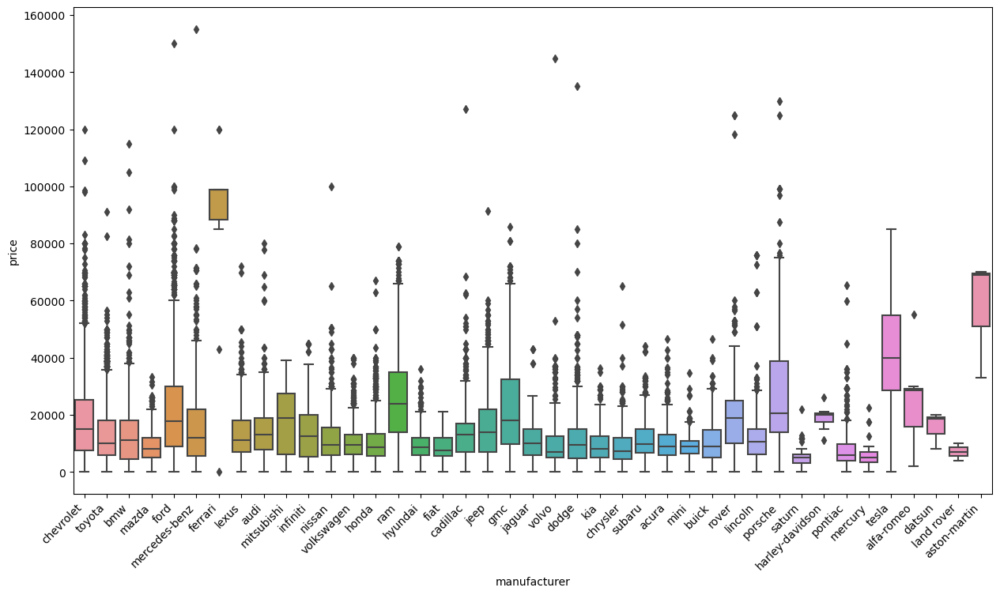

In [99]:
# How does the manufacturer distribution look like ?
plt.figure(figsize=(15,8))
ax = sns.boxplot(x = 'manufacturer', y = 'price', data = filtered_cardata)
temp = ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, horizontalalignment='right')

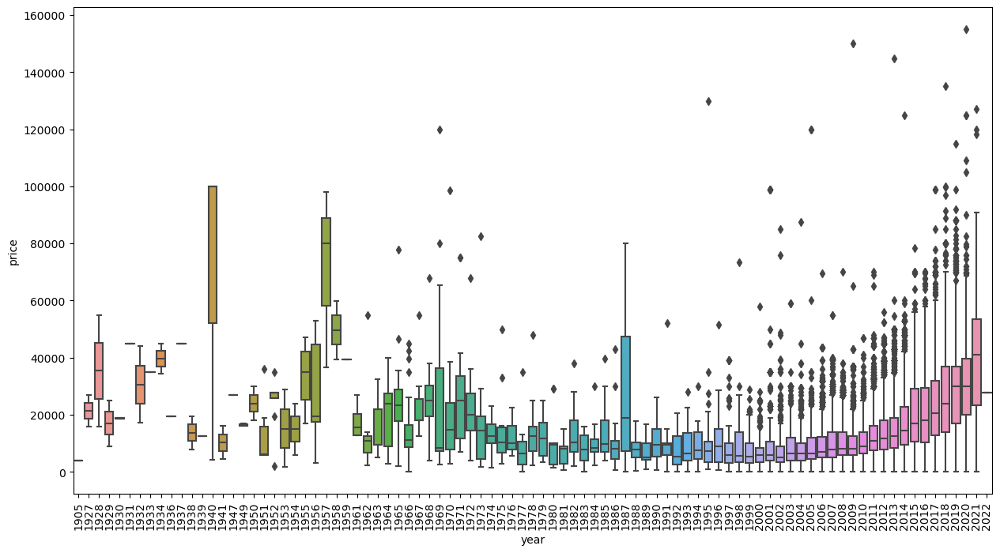

In [100]:
# How does the year the car was build impact the price?
plt.figure(figsize=(15,8))
ax = sns.boxplot(x = 'year', y = 'price', data = filtered_cardata)
temp = ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)

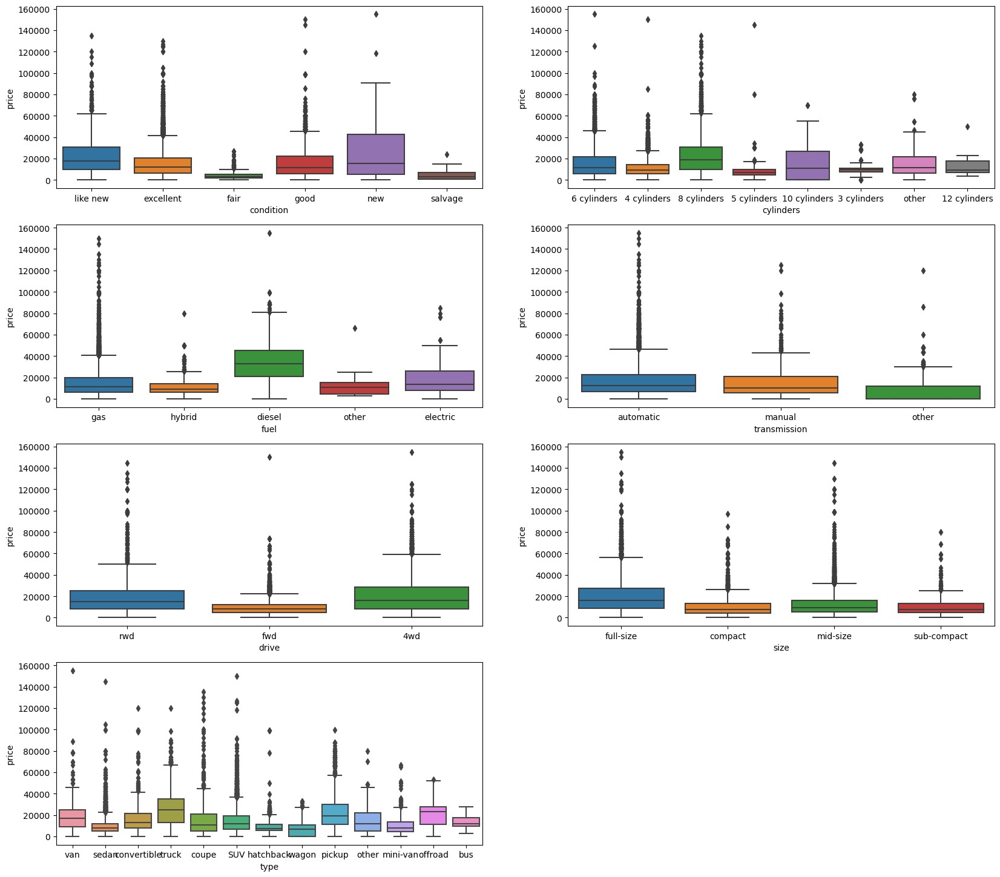

In [101]:
# Analyzing the categorical features and their impact on the price of the car
col_category = ['condition','cylinders','fuel','transmission','drive','size','type']
k=0
plt.figure(figsize=(20,18))
for col in range (len(col_category)):    
    k=k+1
    plt.subplot(4, 2, k)   
    ax = sns.boxplot(x = col_category[col], y = 'price', data = filtered_cardata)

In [102]:
# what is the distribution of gas vs diesal vs electric vs hybrid cars
fig2 = px.histogram(filtered_cardata["fuel"])
fig2.show()

In [103]:
# How is the condition of the car 
fig3 = px.violin(filtered_cardata["condition"],points = "all")
fig3.show()

In [104]:
# Are cars from a particular group of states more expensive
fig4 = px.density_heatmap(filtered_cardata,x='state',y='price',marginal_x="histogram",marginal_y="histogram")
fig4.show()

In [105]:
# what is the distribution of cylinders
fig5 = px.histogram(filtered_cardata["cylinders"])
fig5.show()

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [106]:
filtered_cardata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34868 entries, 126 to 426836
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            34868 non-null  int64  
 1   region        34868 non-null  object 
 2   price         34868 non-null  int64  
 3   year          34868 non-null  Int64  
 4   manufacturer  34868 non-null  object 
 5   model         34868 non-null  object 
 6   condition     34868 non-null  object 
 7   cylinders     34868 non-null  object 
 8   fuel          34868 non-null  object 
 9   odometer      34868 non-null  float64
 10  title_status  34868 non-null  object 
 11  transmission  34868 non-null  object 
 12  VIN           34868 non-null  object 
 13  drive         34868 non-null  object 
 14  size          34868 non-null  object 
 15  type          34868 non-null  object 
 16  paint_color   34868 non-null  object 
 17  state         34868 non-null  object 
dtypes: Int64(1), float64(1)

In [107]:
#converting categorical data into numeric
# condition
# Convert "excellent" to 1  "good" to 2 "fair" to 3 "new" to 4 "likenew" to 5 "salvage" to 6
filtered_cardata['condition'] = filtered_cardata['condition'].map({'excellent': 1, 'good': 2,'fair':3,'new':4,'like new':5,'salvage':6})
filtered_cardata.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
126,7305672709,auburn,0,2018,chevrolet,express cargo van,5,6 cylinders,gas,68472.0,clean,automatic,1GCWGAFP8J1309579,rwd,full-size,van,white,al
127,7305672266,auburn,0,2019,chevrolet,express cargo van,5,6 cylinders,gas,69125.0,clean,automatic,1GCWGAFP4K1214373,rwd,full-size,van,white,al
128,7305672252,auburn,0,2018,chevrolet,express cargo van,5,6 cylinders,gas,66555.0,clean,automatic,1GCWGAFPXJ1337903,rwd,full-size,van,white,al
215,7316482063,birmingham,4000,2002,toyota,echo,1,4 cylinders,gas,155000.0,clean,automatic,JTDBT123520243495,fwd,compact,sedan,blue,al
219,7316429417,birmingham,2500,1995,bmw,525i,3,6 cylinders,gas,110661.0,clean,automatic,WBAHD6322SGK86772,rwd,mid-size,sedan,white,al


In [108]:
# cylinders
# Convert "12 cylinders" to 1  "10 cylinders" to 2 "8 cylinders" to 3 "6 cylinders" to 4 "5 cylinders" to 5 "4 cylinders" to 6 "3 cylinders" to 7 "other" to 8
filtered_cardata['cylinders'] = filtered_cardata['cylinders'].map({'12 cylinders': 1, '10 cylinders': 2,'8 cylinders':3,'6 cylinders':4,'5 cylinders':5,'4 cylinders':6,'3 cylinders':7,'other':8})
filtered_cardata.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
126,7305672709,auburn,0,2018,chevrolet,express cargo van,5,4,gas,68472.0,clean,automatic,1GCWGAFP8J1309579,rwd,full-size,van,white,al
127,7305672266,auburn,0,2019,chevrolet,express cargo van,5,4,gas,69125.0,clean,automatic,1GCWGAFP4K1214373,rwd,full-size,van,white,al
128,7305672252,auburn,0,2018,chevrolet,express cargo van,5,4,gas,66555.0,clean,automatic,1GCWGAFPXJ1337903,rwd,full-size,van,white,al
215,7316482063,birmingham,4000,2002,toyota,echo,1,6,gas,155000.0,clean,automatic,JTDBT123520243495,fwd,compact,sedan,blue,al
219,7316429417,birmingham,2500,1995,bmw,525i,3,4,gas,110661.0,clean,automatic,WBAHD6322SGK86772,rwd,mid-size,sedan,white,al


In [109]:
# fuel
# Convert "gas" to 1  "electric" to 2 "diesel" to 3 "hybrid" to 4 "other" to 5
filtered_cardata['fuel'] = filtered_cardata['fuel'].map({'gas': 1, 'electric': 2,'diesel':3,'hybrid':4,'other':5})
filtered_cardata.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
126,7305672709,auburn,0,2018,chevrolet,express cargo van,5,4,1,68472.0,clean,automatic,1GCWGAFP8J1309579,rwd,full-size,van,white,al
127,7305672266,auburn,0,2019,chevrolet,express cargo van,5,4,1,69125.0,clean,automatic,1GCWGAFP4K1214373,rwd,full-size,van,white,al
128,7305672252,auburn,0,2018,chevrolet,express cargo van,5,4,1,66555.0,clean,automatic,1GCWGAFPXJ1337903,rwd,full-size,van,white,al
215,7316482063,birmingham,4000,2002,toyota,echo,1,6,1,155000.0,clean,automatic,JTDBT123520243495,fwd,compact,sedan,blue,al
219,7316429417,birmingham,2500,1995,bmw,525i,3,4,1,110661.0,clean,automatic,WBAHD6322SGK86772,rwd,mid-size,sedan,white,al


In [110]:
# transmission
# Convert "automatic" to 1  "manual" to 2 "other" to 3
filtered_cardata['transmission'] = filtered_cardata['transmission'].map({'automatic': 1, 'manual': 2,'other':3})
filtered_cardata.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
126,7305672709,auburn,0,2018,chevrolet,express cargo van,5,4,1,68472.0,clean,1,1GCWGAFP8J1309579,rwd,full-size,van,white,al
127,7305672266,auburn,0,2019,chevrolet,express cargo van,5,4,1,69125.0,clean,1,1GCWGAFP4K1214373,rwd,full-size,van,white,al
128,7305672252,auburn,0,2018,chevrolet,express cargo van,5,4,1,66555.0,clean,1,1GCWGAFPXJ1337903,rwd,full-size,van,white,al
215,7316482063,birmingham,4000,2002,toyota,echo,1,6,1,155000.0,clean,1,JTDBT123520243495,fwd,compact,sedan,blue,al
219,7316429417,birmingham,2500,1995,bmw,525i,3,4,1,110661.0,clean,1,WBAHD6322SGK86772,rwd,mid-size,sedan,white,al


In [111]:
# drive
# Convert "4wd" to 1  "fwd" to 2 "rwd" to 3
filtered_cardata['drive'] = filtered_cardata['drive'].map({'4wd': 1, 'fwd': 2,'rwd':3})
filtered_cardata.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
126,7305672709,auburn,0,2018,chevrolet,express cargo van,5,4,1,68472.0,clean,1,1GCWGAFP8J1309579,3,full-size,van,white,al
127,7305672266,auburn,0,2019,chevrolet,express cargo van,5,4,1,69125.0,clean,1,1GCWGAFP4K1214373,3,full-size,van,white,al
128,7305672252,auburn,0,2018,chevrolet,express cargo van,5,4,1,66555.0,clean,1,1GCWGAFPXJ1337903,3,full-size,van,white,al
215,7316482063,birmingham,4000,2002,toyota,echo,1,6,1,155000.0,clean,1,JTDBT123520243495,2,compact,sedan,blue,al
219,7316429417,birmingham,2500,1995,bmw,525i,3,4,1,110661.0,clean,1,WBAHD6322SGK86772,3,mid-size,sedan,white,al


In [112]:
# size
# Convert "compact" to 1  "sub-compact" to 2 "full-size" to 3 "mid-size" to 4
filtered_cardata['size'] = filtered_cardata['size'].map({'compact': 1, 'sub-compact': 2,'full-size':3,'mid-size':4})
filtered_cardata.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
126,7305672709,auburn,0,2018,chevrolet,express cargo van,5,4,1,68472.0,clean,1,1GCWGAFP8J1309579,3,3,van,white,al
127,7305672266,auburn,0,2019,chevrolet,express cargo van,5,4,1,69125.0,clean,1,1GCWGAFP4K1214373,3,3,van,white,al
128,7305672252,auburn,0,2018,chevrolet,express cargo van,5,4,1,66555.0,clean,1,1GCWGAFPXJ1337903,3,3,van,white,al
215,7316482063,birmingham,4000,2002,toyota,echo,1,6,1,155000.0,clean,1,JTDBT123520243495,2,1,sedan,blue,al
219,7316429417,birmingham,2500,1995,bmw,525i,3,4,1,110661.0,clean,1,WBAHD6322SGK86772,3,4,sedan,white,al


In [113]:
# type
# Convert "bus" to 1  "convertible" to 2 "coupe" to 3 "hatchback" to 4 "mini-van" to 5 "offroad" to 6
#"pickup" to 7 "sedan" to 8 "SUV" to 9 "truck" to 10 "van" to 11 "wagon" to 12 "other" to 13
filtered_cardata['type'] = filtered_cardata['type'].map({'bus': 1, 'convertible': 2,'coupe':3,'hatchback':4,'mini-van':5,'offroad':6,\
                                'pickup':7, 'sedan':8,'SUV':9,'truck':10,'van':11,'wagon':12,'other':13 })
filtered_cardata.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
126,7305672709,auburn,0,2018,chevrolet,express cargo van,5,4,1,68472.0,clean,1,1GCWGAFP8J1309579,3,3,11,white,al
127,7305672266,auburn,0,2019,chevrolet,express cargo van,5,4,1,69125.0,clean,1,1GCWGAFP4K1214373,3,3,11,white,al
128,7305672252,auburn,0,2018,chevrolet,express cargo van,5,4,1,66555.0,clean,1,1GCWGAFPXJ1337903,3,3,11,white,al
215,7316482063,birmingham,4000,2002,toyota,echo,1,6,1,155000.0,clean,1,JTDBT123520243495,2,1,8,blue,al
219,7316429417,birmingham,2500,1995,bmw,525i,3,4,1,110661.0,clean,1,WBAHD6322SGK86772,3,4,8,white,al


In [114]:
filtered_cardata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34868 entries, 126 to 426836
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            34868 non-null  int64  
 1   region        34868 non-null  object 
 2   price         34868 non-null  int64  
 3   year          34868 non-null  Int64  
 4   manufacturer  34868 non-null  object 
 5   model         34868 non-null  object 
 6   condition     34868 non-null  int64  
 7   cylinders     34868 non-null  int64  
 8   fuel          34868 non-null  int64  
 9   odometer      34868 non-null  float64
 10  title_status  34868 non-null  object 
 11  transmission  34868 non-null  int64  
 12  VIN           34868 non-null  object 
 13  drive         34868 non-null  int64  
 14  size          34868 non-null  int64  
 15  type          34868 non-null  int64  
 16  paint_color   34868 non-null  object 
 17  state         34868 non-null  object 
dtypes: Int64(1), float64(1)

In [115]:
filtered_cardata.corr()

,id,price,year,condition,cylinders,fuel,odometer,transmission,drive,size,type
id,1.000000,-0.049819,-0.069513,0.025207,0.031920,-0.015742,0.028310,0.011599,0.040753,-0.012980,-0.065736
price,-0.049819,1.000000,0.254059,0.125681,-0.296847,0.314928,-0.199988,-0.087623,-0.133603,0.042861,0.122231
year,-0.069513,0.254059,1.000000,0.045959,0.122460,0.031547,-0.219942,-0.109212,-0.187582,-0.004170,0.198331
condition,0.025207,0.125681,0.045959,1.000000,0.022049,0.005648,-0.064106,-0.038487,0.047696,0.016981,-0.004247
cylinders,0.031920,-0.296847,0.122460,0.022049,1.000000,-0.101633,-0.066603,0.030608,0.043481,-0.085678,-0.173476
fuel,-0.015742,0.314928,0.031547,0.005648,-0.101633,1.000000,0.037521,-0.030522,-0.082257,-0.019151,0.068063
odometer,0.028310,-0.199988,-0.219942,-0.064106,-0.066603,0.037521,1.000000,-0.019429,-0.019671,0.023979,0.036795
transmission,0.011599,-0.087623,-0.109212,-0.038487,0.030608,-0.030522,-0.019429,1.000000,-0.002981,-0.149027,-0.118897
drive,0.040753,-0.133603,-0.187582,0.047696,0.043481,-0.082257,-0.019671,-0.002981,1.000000,-0.030337,-0.223094
size,-0.012980,0.042861,-0.004170,0.016981,-0.085678,-0.019151,0.023979,-0.149027,-0.030337,1.000000,0.097443


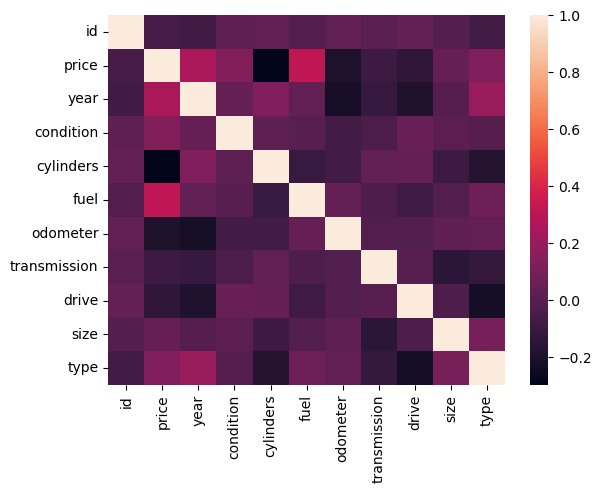

In [116]:
sns.heatmap(filtered_cardata.corr());

In [117]:
# filtering columns that are necessary for the analysis
selected_columns = filtered_cardata.filter(['price','year', 'manufacturer', 'condition','cylinders','fuel','transmission','drive','size','type'])

In [118]:
#creating dummy variables
X = pd.get_dummies(selected_columns).drop('price', axis = 1)
y = selected_columns['price']

In [119]:
X.head()

,year,condition,cylinders,fuel,transmission,drive,size,type,manufacturer_acura,manufacturer_alfa-romeo,...,manufacturer_pontiac,manufacturer_porsche,manufacturer_ram,manufacturer_rover,manufacturer_saturn,manufacturer_subaru,manufacturer_tesla,manufacturer_toyota,manufacturer_volkswagen,manufacturer_volvo
126,2018,5,4,1,1,3,3,11,0,0,...,0,0,0,0,0,0,0,0,0,0
127,2019,5,4,1,1,3,3,11,0,0,...,0,0,0,0,0,0,0,0,0,0
128,2018,5,4,1,1,3,3,11,0,0,...,0,0,0,0,0,0,0,0,0,0
215,2002,1,6,1,1,2,1,8,0,0,...,0,0,0,0,0,0,0,1,0,0
219,1995,3,4,1,1,3,4,8,0,0,...,0,0,0,0,0,0,0,0,0,0


In [120]:
y.head()

126       0
127       0
128       0
215    4000
219    2500
Name: price, dtype: int64

In [121]:
#splitting data into train and test
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.3,random_state = 42)

In [122]:
hold_out_mses = []

for deg in range( 1, 3 ):
    pipe = Pipeline([
        ('holdout_transform', PolynomialFeatures (degree = deg, include_bias = False)),
        ('holdout_regression',LinearRegression())
    ])
    pipe.fit(X_train,y_train)
    hold_out_mses.append( mean_squared_error( y_test, pipe.predict( X_test ) ) )
print (hold_out_mses)

[131111246.29884404, 371531303983357.1]


In [123]:
best_complexity = hold_out_mses.index(min(hold_out_mses)) + 1
best_mse = min(hold_out_mses)
print (best_mse)
print(best_complexity)

131111246.29884404
1


In [124]:
pipe = Pipeline([
        ('holdout_transform', PolynomialFeatures (degree = 1, include_bias = False)),
        ('holdout_regression',LinearRegression())
    ])
pipe.fit(X_train,y_train)
mse = mean_squared_error( y_test, pipe.predict( X_test ) ) 
print (mse)

131111246.29884404


[125908405.15534437, 125876720.00397937, 125755798.70612986, 125681973.44042166, 125743902.78106344, 125745823.55379686]


Text(0, 0.5, 'Mean Squared Error')

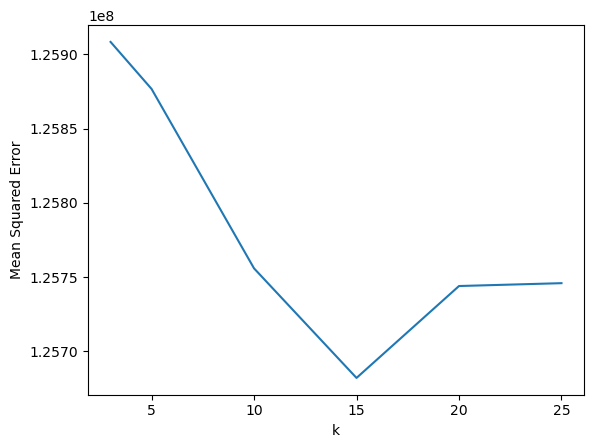

In [125]:
#using K Fold cv to evaluate the model
# Putting everything together
mean_abs_score = []
cv_all = [3,5,10,15,20,25]
for i in cv_all:
    cvs = KFold(n_splits=i, random_state=1, shuffle=True)
    scores_all = cross_val_score(pipe, X, y, scoring='neg_mean_squared_error',cv=cvs, n_jobs=-1)
    mean(absolute(scores_all))
    mean_abs_score.append(mean(absolute(scores_all)))
print(mean_abs_score)
plt.plot(cv_all, mean_abs_score)
plt.xlabel('k')
plt.ylabel('Mean Squared Error')

In [126]:
best_kmse = min(mean_abs_score)
print (best_kmse)

125681973.44042166


### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [127]:
#Building Ridge Regression model
ridge_pipe = Pipeline([ ('scaler', StandardScaler()),
                        ('ridge', Ridge())])
param_dict = {'ridge__alpha':[0.001,0.1,1.0,10.0,100.0,1000.0]}
grid_ridge = GridSearchCV(ridge_pipe,param_grid = param_dict)
ridge_model = grid_ridge.fit(X_train, y_train)
ridge_coefs = ridge_model.best_estimator_.named_steps['ridge'].coef_
print(ridge_coefs)

[ 3.57399347e+03  1.62290031e+03 -3.48906088e+03  3.25063307e+03
 -6.92956431e+02 -7.50366068e+02  1.53639023e+02 -4.55952308e+02
 -2.56024109e+02  3.00758139e+02  4.39783509e+02  3.22618561e+01
 -2.93869736e+02 -2.53512640e+02 -2.65933550e+02  2.98487469e+02
 -6.37981893e+02  1.54490110e+02 -6.56568692e+02  1.24621780e+03
 -1.29504860e+02  9.09614035e+02  3.01644593e+02  1.55258759e+01
 -3.41819716e+02 -4.13393500e+02 -3.00741128e+02 -8.28998084e+01
  6.69244775e+01 -4.55137344e+02 -4.25820950e+01 -2.97352821e+02
 -1.70334201e+02 -1.24360739e+02 -1.99842229e+01 -2.66334931e+02
 -1.12738785e+00  3.60805076e+02 -5.65273376e+02 -2.56397267e+01
  9.56522091e+02  6.48031072e+02  4.12101878e+02 -2.93164757e+02
 -2.76189544e+01  7.03199082e+02 -2.00359466e+02 -1.95147645e+02
 -1.72567323e+02]


In [128]:
train_preds = grid_ridge.predict(X_train)
test_preds = grid_ridge.predict(X_test)
train_mse = mean_squared_error(y_train, train_preds)
test_mse = mean_squared_error(y_test, test_preds)
print(f'Train MSE: {train_mse}')
print(f'Test MSE: {test_mse}')

Train MSE: 122756193.69032922
Test MSE: 131094648.00515078


In [129]:
ridge_best_params = grid_ridge.best_params_
print(ridge_best_params)
best_ridge_estimator = grid_ridge.best_estimator_
print(best_ridge_estimator)
print(ridge_model.best_estimator_.named_steps['ridge'].coef_)

{'ridge__alpha': 100.0}
Pipeline(steps=[('scaler', StandardScaler()), ('ridge', Ridge(alpha=100.0))])
[ 3.57399347e+03  1.62290031e+03 -3.48906088e+03  3.25063307e+03
 -6.92956431e+02 -7.50366068e+02  1.53639023e+02 -4.55952308e+02
 -2.56024109e+02  3.00758139e+02  4.39783509e+02  3.22618561e+01
 -2.93869736e+02 -2.53512640e+02 -2.65933550e+02  2.98487469e+02
 -6.37981893e+02  1.54490110e+02 -6.56568692e+02  1.24621780e+03
 -1.29504860e+02  9.09614035e+02  3.01644593e+02  1.55258759e+01
 -3.41819716e+02 -4.13393500e+02 -3.00741128e+02 -8.28998084e+01
  6.69244775e+01 -4.55137344e+02 -4.25820950e+01 -2.97352821e+02
 -1.70334201e+02 -1.24360739e+02 -1.99842229e+01 -2.66334931e+02
 -1.12738785e+00  3.60805076e+02 -5.65273376e+02 -2.56397267e+01
  9.56522091e+02  6.48031072e+02  4.12101878e+02 -2.93164757e+02
 -2.76189544e+01  7.03199082e+02 -2.00359466e+02 -1.95147645e+02
 -1.72567323e+02]


In [130]:
ridge_coefs = ridge_model.best_estimator_.named_steps['ridge'].coef_
ridge_df = pd.DataFrame({'feature': X.columns, 'coef': ridge_coefs})
ridge_df.sort_values('coef',ascending = False)

,feature,coef
0,year,3573.993471
3,fuel,3250.633075
1,condition,1622.900310
19,manufacturer_ferrari,1246.217798
40,manufacturer_porsche,956.522091
21,manufacturer_ford,909.614035
45,manufacturer_tesla,703.199082
41,manufacturer_ram,648.031072
10,manufacturer_aston-martin,439.783509
42,manufacturer_rover,412.101878


### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

In [131]:
# Building a pipeline to find the best n features
sequential_pipe = Pipeline([
                           ('poly_features', PolynomialFeatures(degree = 1, include_bias = False)),
                           ('selector', SequentialFeatureSelector(LinearRegression())),
                           ('ridge', Ridge(alpha = 100))
                           ])

param_dict = {'selector__n_features_to_select': [2, 3, 4, 6, 8]}
selector_grid = GridSearchCV(sequential_pipe, param_grid=param_dict)
model = selector_grid.fit(X_train, y_train)
train_preds = selector_grid.predict(X_train)
test_preds = selector_grid.predict(X_test)
selector_train_mse = mean_squared_error(y_train, train_preds)
selector_test_mse = mean_squared_error(y_test, test_preds)

In [132]:
print(selector_train_mse)
print(selector_test_mse)

128548769.06285727
137156423.60352865


In [133]:
best_estimator = selector_grid.best_estimator_
best_selector = best_estimator.named_steps['selector']
best_model = selector_grid.best_estimator_.named_steps['ridge']
feature_names = X_train.columns[best_selector.get_support()]
coefs = best_model.coef_


print(best_estimator)
print(f'Features from best selector: {feature_names}.')
print('Coefficient values: ')
print('===================')
pd.DataFrame([coefs.T], columns = feature_names, index = ['ridge'])

Pipeline(steps=[('poly_features',
                 PolynomialFeatures(degree=1, include_bias=False)),
                ('selector',
                 SequentialFeatureSelector(estimator=LinearRegression(),
                                           n_features_to_select=8)),
                ('ridge', Ridge(alpha=100))])
Features from best selector: Index(['year', 'condition', 'cylinders', 'fuel', 'drive',
       'manufacturer_ferrari', 'manufacturer_ford', 'manufacturer_porsche'],
      dtype='object').
Coefficient values: 


,year,condition,cylinders,fuel,drive,manufacturer_ferrari,manufacturer_ford,manufacturer_porsche
ridge,510.477697,1322.475635,-3001.076438,5410.140253,-993.008918,4877.493897,2352.971193,7740.477101


In [134]:
'''using multiple metric evaluation'''
scoring = ['r2', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error']
r_multi = permutation_importance(
     model, X_test, y_test, n_repeats=30, random_state=0, scoring=scoring)
for metric in r_multi:
     print(f"{metric}")
     r = r_multi[metric]
     for i in r.importances_mean.argsort()[::-1]:
         if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
             print(f"     {X_test.columns[i]:<8}"
                   f"     {r.importances_mean[i]:.3f}"
                   f" +/- {r.importances_std[i]:.3f}")

r2
     cylinders     0.162 +/- 0.004
     year         0.137 +/- 0.005
     fuel         0.132 +/- 0.004
     condition     0.026 +/- 0.002
     manufacturer_ford     0.012 +/- 0.001
     manufacturer_porsche     0.007 +/- 0.001
     drive        0.007 +/- 0.001
     manufacturer_ferrari     0.001 +/- 0.000
neg_mean_absolute_percentage_error
     condition     115462831194739504.000 +/- 15105241659889312.000
neg_mean_squared_error
     cylinders     30194751.698 +/- 774294.805
     year         25511282.355 +/- 897171.441
     fuel         24489474.018 +/- 824684.169
     condition     4739515.167 +/- 336800.878
     manufacturer_ford     2220810.854 +/- 174960.897
     manufacturer_porsche     1322297.061 +/- 93658.525
     drive        1269259.040 +/- 156703.486
     manufacturer_ferrari     197158.908 +/- 24921.155


### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

<AxesSubplot:xlabel='cylinders', ylabel='price'>

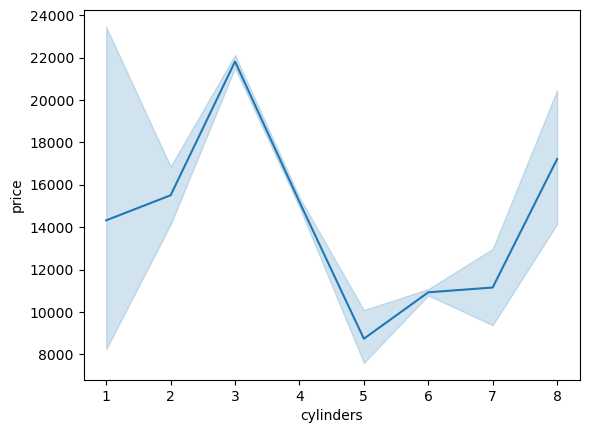

In [146]:
# Based on the model built the number of cyclinders in a used car drives the price of the car
sns.lineplot(data=filtered_cardata, x="cylinders", y="price")

In [145]:
# Most of the cars that are priciest (>40K) have either 3 or 4 cylinders
fig = px.scatter(filtered_cardata,x = 'cylinders', y='price',color = 'manufacturer')
fig.show()

In [151]:
# Most of the cars that are expensive (price > 40000) are 3 cylinder cars 
cylinder2 = filtered_cardata.query("price > 40000 & cylinders == 2")["cylinders"].shape[0]
cylinder3 = filtered_cardata.query("price > 40000 & cylinders == 3")["cylinders"].shape[0]
cylinder4 = filtered_cardata.query("price > 40000 & cylinders == 4")["cylinders"].shape[0]
cylinder6 = filtered_cardata.query("price > 40000 & cylinders == 4")["cylinders"].shape[0]
print("Nos of 2 cylinder cars with price>40K: "+ str(cylinder2))
print("Nos of 3 cylinder cars with price>40K: "+ str(cylinder3))
print("Nos of 4 cylinder cars with price>40K: "+ str(cylinder4))
print("Nos of 6 cylinder cars with price>40K: "+ str(cylinder6))

Nos of 2 cylinder cars with price>40K: 39
Nos of 3 cylinder cars with price>40K: 1207
Nos of 4 cylinder cars with price>40K: 515
Nos of 6 cylinder cars with price>40K: 515


<AxesSubplot:xlabel='year', ylabel='price'>

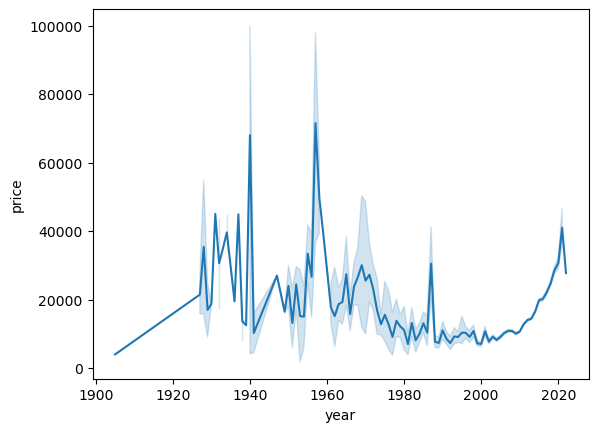

In [152]:
# The year the car was manufactured also drives the price of the car
sns.lineplot(data=filtered_cardata, x="year", y="price")

In [164]:
# Except few jumps in the price of the car that has been noticeable in the year 40s and 60s, but the cars built in the
# most recent years yield maximum price
fig = px.scatter(filtered_cardata,x = 'year', y='price',color = 'manufacturer')
fig.show()

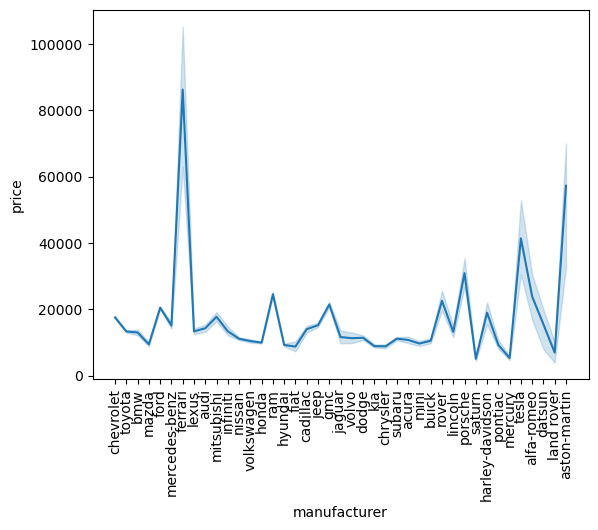

In [165]:
# Distribution of some of the manufacturers of some of the most expensive cars (mercedes benz,ferrari,alfa-romeo) 
# which can fetch a very good price 
sns.lineplot(data=filtered_cardata, x="manufacturer", y="price")
plt.xticks(rotation=90);

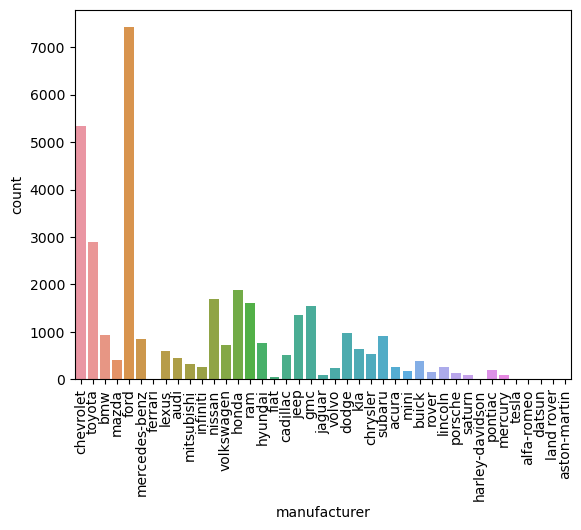

In [166]:
# Most of the cars in the inventory are ford,chevrolet and toyota
sns.countplot(data = filtered_cardata, x = "manufacturer")
plt.xticks(rotation = 90);

In [167]:
# Distribution of the Ford models w.r.t their price 
fig = px.scatter(filtered_cardata[(filtered_cardata["manufacturer"].str.contains("ford"))],x = 'model', y='price',color = 'manufacturer')
fig.show()

In [168]:
# which porsche model is the most expensive ?
fig = px.scatter(filtered_cardata[(filtered_cardata["manufacturer"].str.contains("porsche"))],x = 'model', y='price',color = 'manufacturer')
fig.show()

In [169]:
# which ferrari model is the most expensive ?
fig = px.scatter(filtered_cardata[(filtered_cardata["manufacturer"].str.contains("ferrari"))],x = 'model', y='price',color = 'manufacturer')
fig.show()

<AxesSubplot:xlabel='fuel', ylabel='price'>

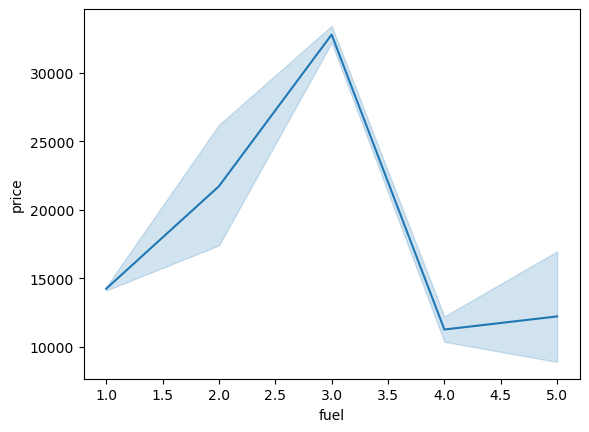

In [170]:
# Whether a car is run by gas, diesal,hybrid  or electric also drives the price of the car.

# "gas" is 1
# "electric" is 2
# "diesel" is 3
# "hybrid" is 4
# "other" is 5
sns.lineplot(data=filtered_cardata, x="fuel", y="price")

In [171]:
# Though gas is a winner but some of the priciest cars are run by diesel and elctric cars(tesla) are also some of the expensive ones 
# "gas" is 1
# "electric" is 2
# "diesel" is 3
# "hybrid" is 4
# "other" is 5
fig = px.scatter(filtered_cardata,x = 'fuel', y='price',color = 'manufacturer')
fig.show()

<AxesSubplot:xlabel='condition', ylabel='price'>

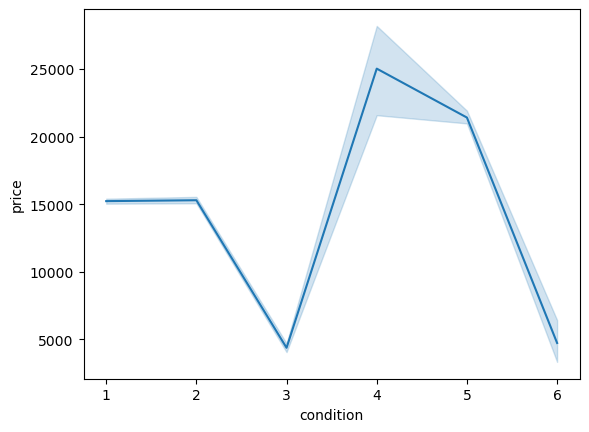

In [172]:
# condition of the car is important for the consumer and drives the price of the car
# "excellent" is 1
# "good" is 2
# "fair" is 3
# "new" is 4
# "likenew" is 5
# "salvage" is 6
sns.lineplot(data=filtered_cardata, x="condition", y="price")

In [173]:
# The expensive cars are either Excellent/ Good/New or LikeNew condition. Cars marked fair or salvage are cheap cars. 
# "excellent" is 1
# "good" is 2
# "fair" is 3
# "new" is 4
# "likenew" is 5
# "salvage" is 6
fig = px.scatter(filtered_cardata,x = 'condition', y='price',color = 'manufacturer')
fig.show()

<AxesSubplot:xlabel='drive', ylabel='price'>

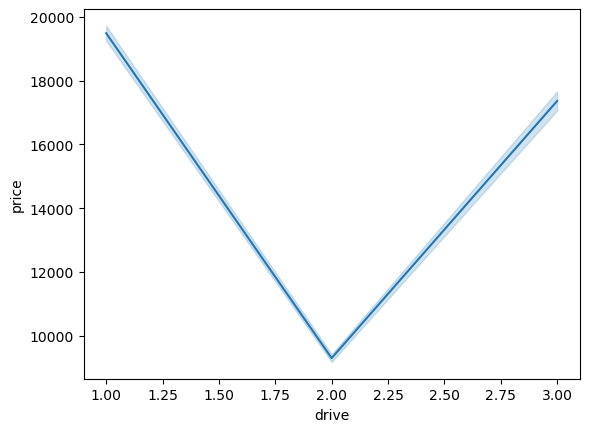

In [174]:
# Whether a car is fwd or rwd also directs the price of the car
# "4wd" is 1
# "fwd" is 2
# "rwd" is 3
sns.lineplot(data=filtered_cardata, x="drive", y="price")

In [176]:
# Most of the expensive cars are either 4wd or rwd
# "4wd" is 1
# "fwd" is 2
# "rwd" is 3
fig = px.scatter(filtered_cardata,x = 'drive', y='price',color = 'manufacturer')
fig.show()